In [1]:
# uncomment this if you have cuda and want to specify the device
#import os
#os.environ["CUDA_VISIBLE_DEVICES"]="1"

# Данные
https://drive.google.com/file/d/1PngzFaDsFuyzV3aKC5T2cvuYuALa7Nwk/view?usp=sharing

In [6]:
import numpy as np
import cv2
import glob
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import tqdm
import seaborn as sns
import torchvision
import torch
import PIL
from PIL import Image
import json

def show_image(image, figsize=(16, 9), reverse=True):
    plt.figure(figsize=figsize)
    if reverse:
        plt.imshow(image[...,::-1])
    else:
        plt.imshow(image)
    plt.axis('off')
    plt.show()

def save_to_json(filename, data):
    with open(filename, 'w') as f:
        return json.dump(data, f)
    
def load_from_json(filename):
    with open(filename, 'r') as f:
        return json.load(f)

# Load COCO info

Useful links:
http://cocodataset.org/#home

In [7]:
coco_id_to_name = load_from_json("coco_id_to_name.json")

In [8]:
coco_id_to_name = {int(key): value for key, value in coco_id_to_name.items()}

In [9]:
len(coco_id_to_name)

80

In [10]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

# Sample run

In [11]:
file = 'detection_examples/mrs_maisel.jpg'

https://github.com/pytorch/vision/blob/c732dfe2a4b1c861d8d1fedd7999f473f8cd3142/torchvision/models/detection/faster_rcnn.py#L24

In [12]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, progress=True,
                            num_classes=91, pretrained_backbone=True)

In [13]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [14]:
from torchvision import transforms

to_tensor = transforms.ToTensor()

def val_transform(img):
    img_tensor = to_tensor(img)
    return img_tensor.unsqueeze(0)

def visualize_prediction(file, model, device='cuda', verbose=True, thresh=0.0, n_colors=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    for i in range(len(prediction['boxes'])):
        x1, x2, x3, x4 = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = coco_id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x1, x2), (x3, x4), np.array(color) * 255, 2)
            cv2.putText(image, name, (x1, x2-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

In [15]:
file

'detection_examples/mrs_maisel.jpg'

In [17]:
img = Image.open(file)

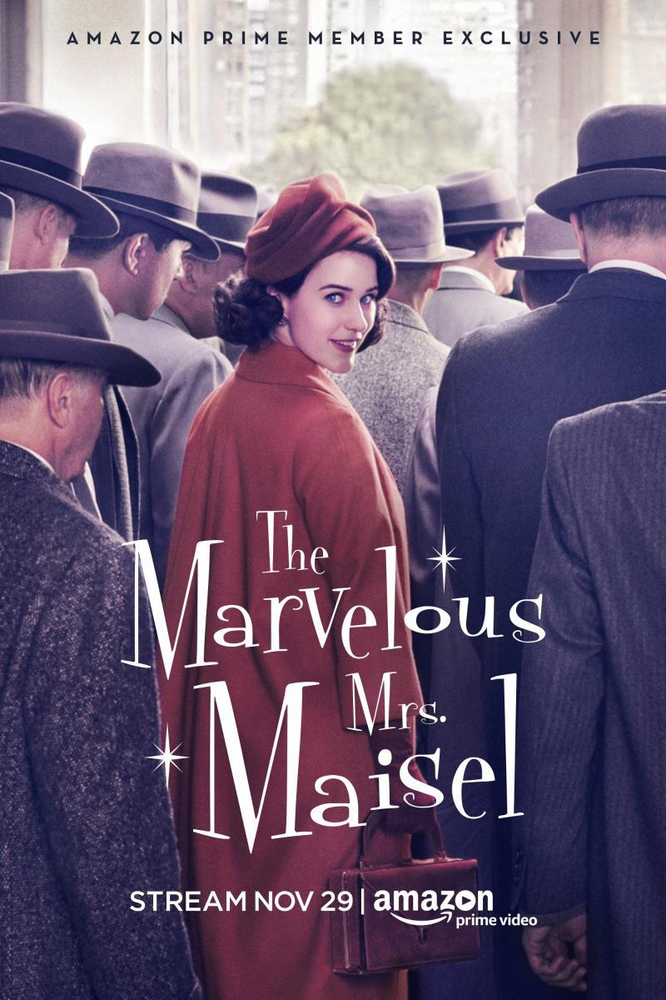

In [18]:
img

/opt/conda/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Class: person, Confidence: 0.9957576394081116
Class: person, Confidence: 0.9785686135292053
Class: person, Confidence: 0.9711196422576904
Class: person, Confidence: 0.9520586729049683
Class: person, Confidence: 0.9485945105552673
Class: person, Confidence: 0.9434379935264587
Class: person, Confidence: 0.9264215230941772
Class: person, Confidence: 0.9073956608772278
Class: person, Confidence: 0.7227162718772888
Class: person, Confidence: 0.6452593803405762
Class: person, Confidence: 0.6441429257392883
Class: tie, Confidence: 0.6039682030677795
Class: chair, Confidence: 0.40415945649147034
Class: person, Confidence: 0.4040907323360443
Class: person, Confidence: 0.4021979570388794
Class: person, Confidence: 0.3606660068035126
Class: person, Confidence: 0.32138341665267944
Class: person, Confidence: 0.3178975284099579
Class: person, Confidence: 0.30351048707962036
Class: person, Confidence: 0.28436461091041565
Class: chair, Confidence: 0.22806665301322937
Class: person, Confidence: 0.21930

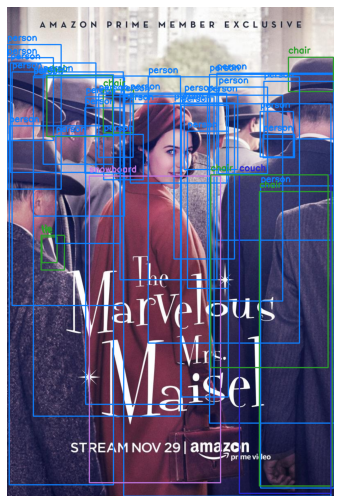

In [19]:
out = visualize_prediction(file, model)

Class: person, Confidence: 0.9957576394081116
Class: person, Confidence: 0.9785686135292053
Class: person, Confidence: 0.9711196422576904
Class: person, Confidence: 0.9520586729049683
Class: person, Confidence: 0.9485945105552673
Class: person, Confidence: 0.9434379935264587
Class: person, Confidence: 0.9264215230941772
Class: person, Confidence: 0.9073956608772278


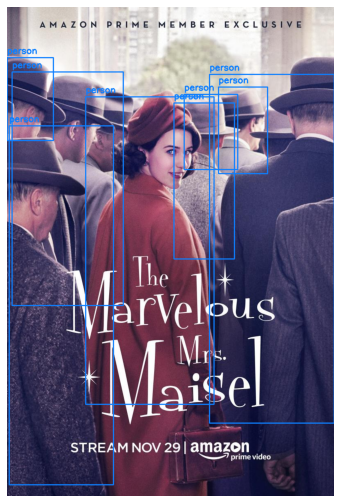

In [20]:
out = visualize_prediction(file, model, thresh=0.8)

# Еще один пример

In [21]:
file = 'detection_examples/junk_food.jpg'

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.9622042179107666
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556109309196472
Class: person, Confidence: 0.8266407251358032
Class: sandwich, Confidence: 0.8228065967559814
Class: hot dog, Confidence: 0.8058313727378845
Class: person, Confidence: 0.5006299614906311
Class: sandwich, Confidence: 0.49351945519447327
Class: person, Confidence: 0.48630672693252563
Class: bowl, Confidence: 0.44700953364372253
Class: person, Confidence: 0.4429386556148529
Class: cake, Confidence: 0.2982223629951477
Class: sandwich, Confidence: 0.26901671290397644
Class: cup, Confidence: 0.2425859272480011
Class: person, Confidence: 0.22882632911205292
Class: dining table, Confidence: 0.2124517858028412
Class: cell phone, Confidence: 0.2023983746767044
Class: person, Confidence: 0.17625756561756134
Class: cell phone, Confidence: 0.17373068630695343
Class: sandwich, Confidence: 0.16645562648773193
Class: hot

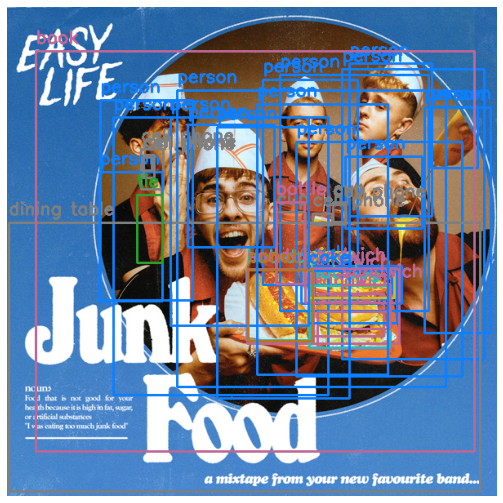

In [22]:
out = visualize_prediction(file, model)

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.9622042179107666
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556109309196472
Class: person, Confidence: 0.8266407251358032
Class: sandwich, Confidence: 0.8228065967559814
Class: hot dog, Confidence: 0.8058313727378845


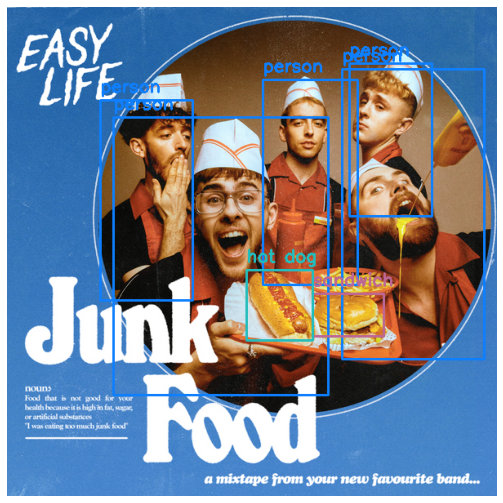

In [23]:
out = visualize_prediction(file, model, thresh=0.8)

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.9622042179107666
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556109309196472
Class: person, Confidence: 0.8266407251358032
Class: sandwich, Confidence: 0.8228065967559814
Class: hot dog, Confidence: 0.8058313727378845
Class: person, Confidence: 0.5006299614906311
Class: sandwich, Confidence: 0.49351945519447327
Class: person, Confidence: 0.48630672693252563
Class: bowl, Confidence: 0.44700953364372253
Class: person, Confidence: 0.4429386556148529


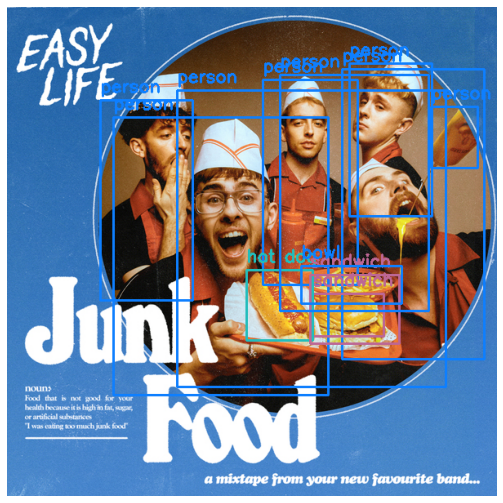

In [24]:
out = visualize_prediction(file, model, thresh=0.4)

In [25]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

# Давайте дообучимся на что-нибудь новое: номерные знаки

### Датасет Open images:
https://storage.googleapis.com/openimages/web/index.html

In [27]:
filename_to_bbox_train_dict = load_from_json('filename_to_bbox_train.json')

In [28]:
filename_to_bbox_train_dict

{'./number_plates/00200.jpg': [[0.445, 0.51375, 0.755833, 0.786667],
  [0.62375, 0.678125, 0.753333, 0.779167]],
 './number_plates/00201.jpg': [[0.2225, 0.3975, 0.885, 0.960833],
  [0.69875, 0.759375, 0.661667, 0.685833]],
 './number_plates/00202.jpg': [[0.2875, 0.421875, 0.54375, 0.589583],
  [0.875, 0.9984379999999999, 0.520833, 0.620833],
  [0.929688, 0.9984379999999999, 0.541667, 0.614583]],
 './number_plates/00203.jpg': [[0.841875, 0.9575, 0.54537, 0.723106],
  [0.029375, 0.141875, 0.183349, 0.23573400000000003],
  [0.845, 0.901875, 0.12628599999999998, 0.187091]],
 './number_plates/00204.jpg': [[0.114379, 0.300654, 0.594771, 0.705882],
  [0.47385600000000005, 0.545752, 0.390523, 0.436274]],
 './number_plates/00205.jpg': [[0.286875,
   0.361875,
   0.680672,
   0.7208220000000001],
  [0.445, 0.4575, 0.6694680000000001, 0.688142],
  [0.776875, 0.838125, 0.694678, 0.722689]],
 './number_plates/00206.jpg': [[0.0075, 0.04625, 0.645, 0.675833],
  [0.24625, 0.305625, 0.674167, 0.725833]

In [29]:
filename_to_bbox_val_dict = load_from_json('filename_to_bbox_val.json')

In [30]:
len(filename_to_bbox_train_dict), len(filename_to_bbox_val_dict)

(1313, 200)

# Визуализируем датасет

In [31]:
def visualize_from_dataset(file, filename_to_bbox_dict):
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    for i in range(len(filename_to_bbox_dict[file])):
        x_min, x_max, y_min, y_max = filename_to_bbox_dict[file][i]
        x_min, y_min, x_max, y_max = int(x_min * w), int(y_min * h), int(x_max * w), int(y_max * h)
        image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    show_image(image)

In [32]:
train_filenames = list(filename_to_bbox_train_dict.keys())

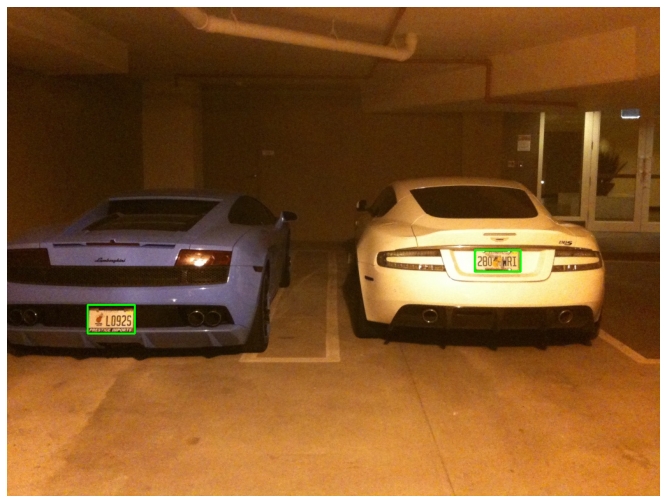

In [33]:
filename = np.random.choice(train_filenames)
visualize_from_dataset(filename, filename_to_bbox_train_dict)

In [34]:
val_filenames = list(filename_to_bbox_val_dict.keys())

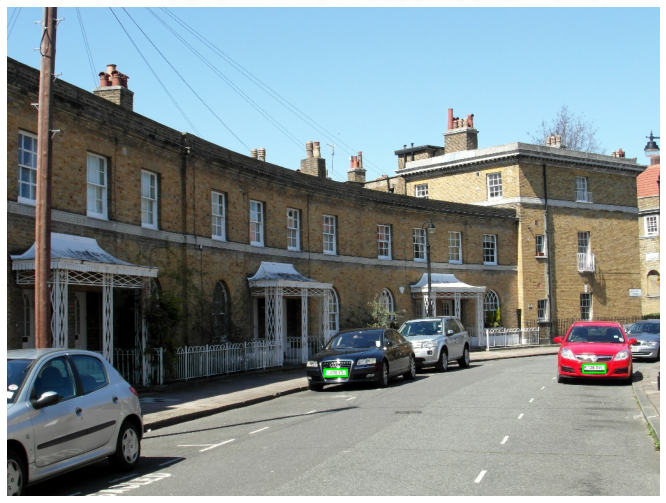

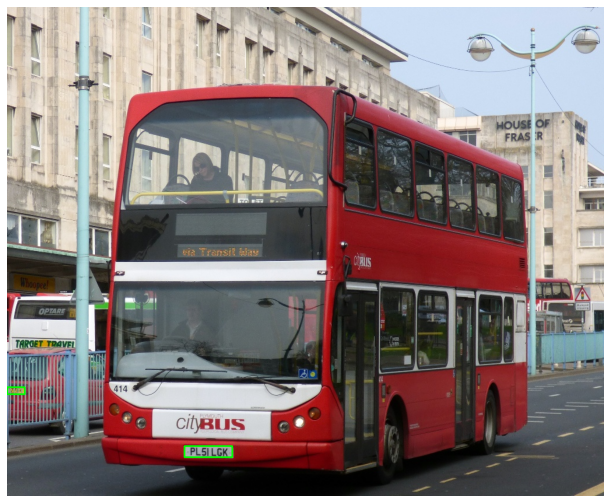

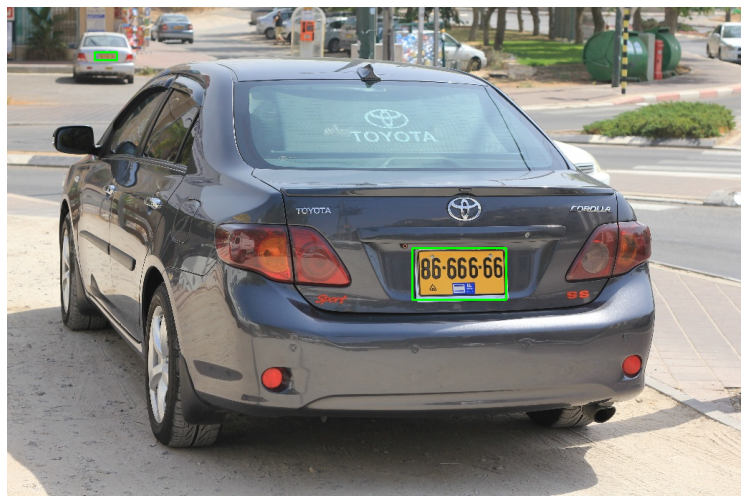

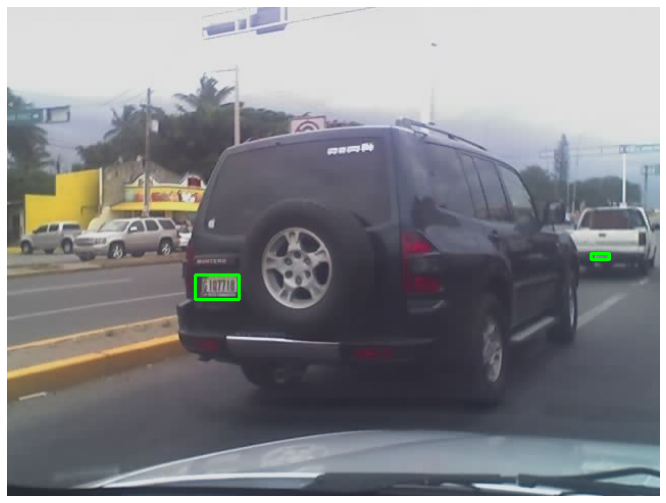

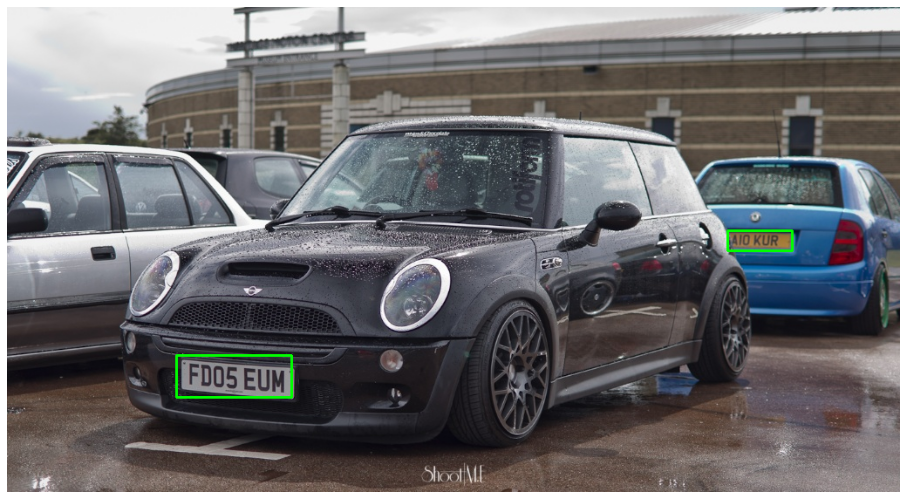

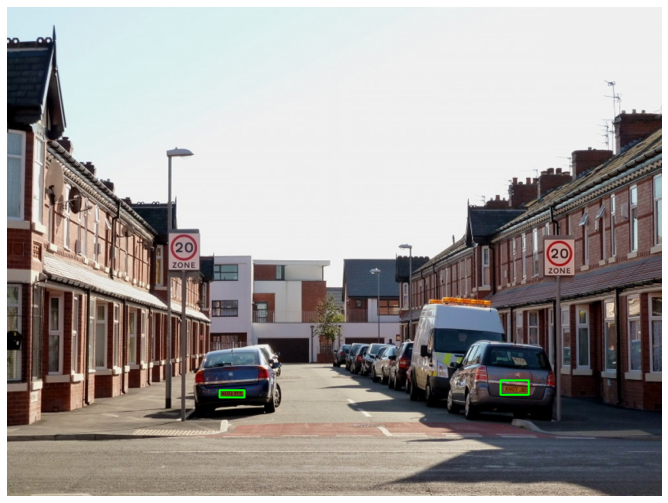

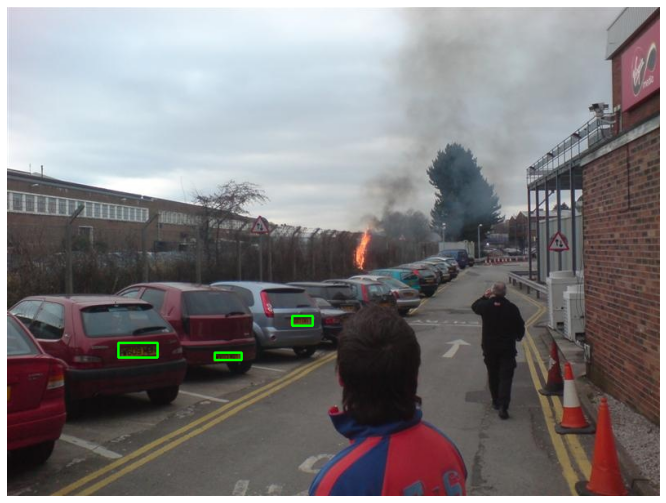

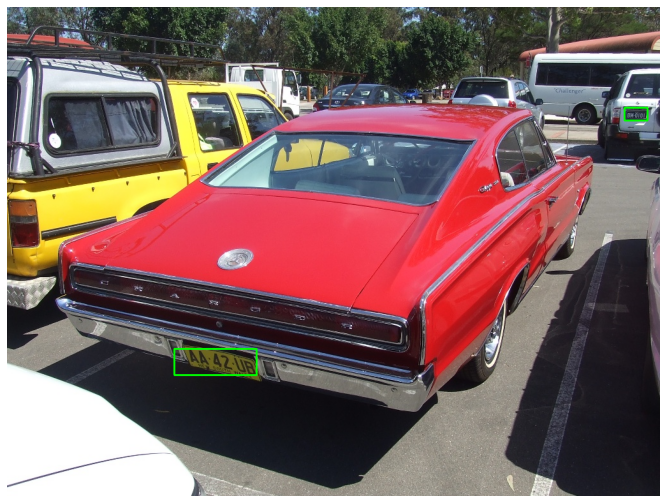

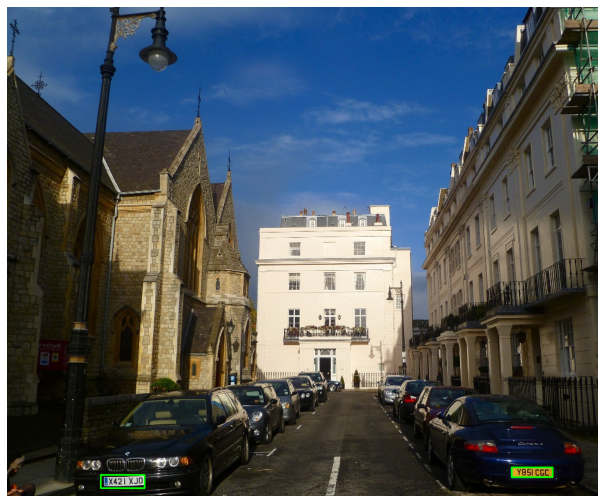

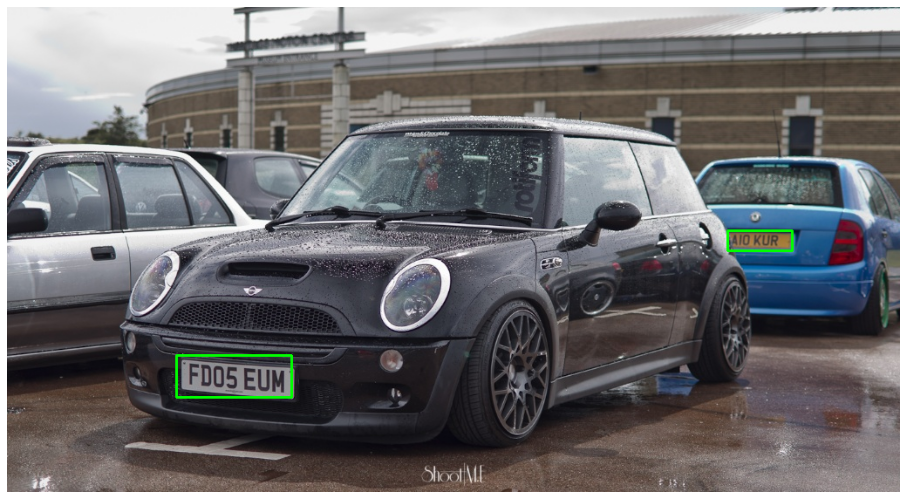

In [35]:
for filename in np.random.choice(val_filenames, 10):
    visualize_from_dataset(filename, filename_to_bbox_val_dict)

# Создадим класс датасета

In [36]:
import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import json
from torchvision import transforms

class DetectionDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict_file, transforms=None):
        self.transforms = transforms
        
        with open(data_dict_file, 'r') as f:
            self.data_dict = json.load(f)
        
        self.imgs = list(self.data_dict.keys())
        
    def __getitem__(self, idx):
        # load images ad masks
        img_path = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")
        w, h = img.size

        num_objs = len(self.data_dict[img_path])
        boxes = []
        for i in range(num_objs):
            bbox = self.data_dict[img_path][i]
            xmin = bbox[0] * w
            xmax = bbox[1] * w
            ymin = bbox[2] * h
            ymax = bbox[3] * h
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        
        image_id = torch.tensor([idx])
    
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id

        if self.transforms is not None:
            img = self.transforms(img)

        return img, target
    
    def __len__(self):
        return len(self.imgs)

# Create transforms

Аугментации для bbox-ов:
* https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/
* https://albumentations.ai/docs/examples/example_bboxes/
* https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/

In [37]:
img_transforms = transforms.Compose([
    transforms.ToTensor()
])

# Load datasets

In [38]:
# collate_fn needs for batch
def collate_fn(batch):
    return tuple(zip(*batch))

In [39]:
# use our dataset and defined transformations
train_dataset = DetectionDataset('filename_to_bbox_train.json', img_transforms)
val_dataset = DetectionDataset('filename_to_bbox_val.json', img_transforms)

In [40]:
for i in train_dataset:
    break

# Make dataloaders

In [41]:
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=2, shuffle=True, num_workers=4,
    collate_fn=collate_fn, drop_last=True)

data_loader_val = torch.utils.data.DataLoader(
    val_dataset, batch_size=2, shuffle=False, num_workers=1,
    collate_fn=collate_fn, drop_last=False)

# Load model

In [42]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, progress=True,
                            num_classes=91, pretrained_backbone=True)

In [43]:
model.roi_heads.box_predictor

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=91, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=364, bias=True)
)

In [44]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True)

num_classes = 2
in_channels = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_channels = in_channels, num_classes = 2)

In [45]:
assert model.roi_heads.box_predictor.cls_score.in_features == 1024
assert model.roi_heads.box_predictor.cls_score.out_features == 2
assert model.roi_heads.box_predictor.bbox_pred.out_features == 8

# Включить обучение только region-proposal сети и головы

In [46]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


for param in model.parameters():
    param.requires_grad = True
for param in model.roi_heads.box_predictor.parameters():
    param.requires_grad = True
    
# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

In [47]:
model.to(device);

In [48]:
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)

backbone.body.conv1.weight
backbone.body.layer1.0.conv1.weight
backbone.body.layer1.0.conv2.weight
backbone.body.layer1.0.conv3.weight
backbone.body.layer1.0.downsample.0.weight
backbone.body.layer1.1.conv1.weight
backbone.body.layer1.1.conv2.weight
backbone.body.layer1.1.conv3.weight
backbone.body.layer1.2.conv1.weight
backbone.body.layer1.2.conv2.weight
backbone.body.layer1.2.conv3.weight
backbone.body.layer2.0.conv1.weight
backbone.body.layer2.0.conv2.weight
backbone.body.layer2.0.conv3.weight
backbone.body.layer2.0.downsample.0.weight
backbone.body.layer2.1.conv1.weight
backbone.body.layer2.1.conv2.weight
backbone.body.layer2.1.conv3.weight
backbone.body.layer2.2.conv1.weight
backbone.body.layer2.2.conv2.weight
backbone.body.layer2.2.conv3.weight
backbone.body.layer2.3.conv1.weight
backbone.body.layer2.3.conv2.weight
backbone.body.layer2.3.conv3.weight
backbone.body.layer3.0.conv1.weight
backbone.body.layer3.0.conv2.weight
backbone.body.layer3.0.conv3.weight
backbone.body.layer3.0.

In [49]:
len(params)

83

In [50]:
for param in model.parameters():
    param.requires_grad = True

In [51]:
len(params)

83

In [52]:
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=30,
                                               gamma=0.1)

# Обучение 

In [53]:
import math
import sys
import time
import torch

def train_one_epoch(model, optimizer, data_loader, device):
    model.train()
    for images, targets in tqdm.tqdm_notebook(data_loader):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # получим предсказания сети (словарь)
        # cложим их
        loss_dict = model(images, targets)
        losses = sum([value for value in loss_dict.values()])
        loss_value = losses.item()
        
        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    print(loss_value)


# Запустим обучение

In [54]:
num_epochs=100
for epoch in tqdm.tqdm_notebook(range(num_epochs)):
    train_one_epoch(model, optimizer, data_loader, device)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/100 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/656 [00:00<?, ?it/s]

0.5906173586845398


  0%|          | 0/656 [00:00<?, ?it/s]

0.18733316659927368


  0%|          | 0/656 [00:00<?, ?it/s]

KeyboardInterrupt: 

## Сохраним модель

In [46]:
torch.save(model.state_dict(), 'model_state_dict_workshop_final.pth')

# Загрузим сохраненную модель

In [65]:
model.load_state_dict(torch.load('model_state_dict_final.pth'))

<All keys matched successfully>

In [66]:
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

# Визуализируем предсказания для валидации

In [67]:
def visualize_prediction_plate(file, model, device='cuda', verbose=True, thresh=0.0, 
                               n_colors=None, id_to_name=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    image = img
    for i in range(len(prediction['boxes'])):
        x_min, y_min, x_max, y_max = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), np.array(color) * 255, 2)
            cv2.putText(image, name, (x_min, y_min-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

# Визуализируем предсказания

In [68]:
val_filenames = list(filename_to_bbox_val_dict.keys())

In [69]:
filename = np.random.choice(val_filenames)

Class: plate, Confidence: 0.996681272983551
Class: plate, Confidence: 0.6091127991676331


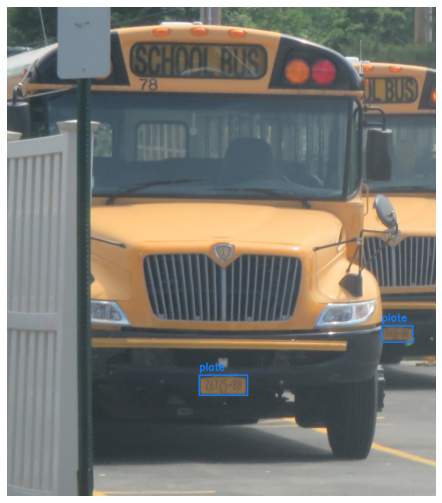

{'boxes': tensor([[401.8171, 771.4654, 502.0226, 813.2825],
         [782.4057, 668.0140, 847.9916, 702.3399],
         [393.1069, 766.3489, 498.4667, 845.1138],
         [654.1617, 620.5402, 743.3080, 665.3268],
         [295.8659, 517.2762, 615.1998, 661.8347]], device='cuda:0'),
 'labels': tensor([1, 1, 1, 1, 1], device='cuda:0'),
 'scores': tensor([0.9967, 0.6091, 0.4442, 0.0942, 0.0583], device='cuda:0')}

In [70]:
filename = np.random.choice(val_filenames)
visualize_prediction_plate(filename, model, id_to_name={1: 'plate'}, thresh=0.5)